In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

pd.set_option('display.max_columns', None)


In [20]:
data = pd.read_excel('dataset.xlsx')

In [42]:
data.shape

(1925, 227)

In [21]:
# prompt: I want to delete records(rows) which has a value other than 1 or 0 in their target (last) column from dataset.

# Filter the DataFrame to keep only rows with 1 or 0 in the target column
data = data[data['target label / yes no'].apply(lambda x: x in [0, 1])]


In [8]:
data.shape

(1912, 227)

In [23]:
# prompt: delete the rows which have missing value in target column.

data = data.dropna(subset=['target label / yes no'])


In [24]:
data.shape

(1912, 227)

In [25]:
# prompt: I want you to generate a code which detects columns which are of categorical type for further encoding. notice that there are mistaken entries in some columns such that a column which is in fact numerical, could contain string values or other objects. Identify numerical columns if more than 90% of their values ​​are of integer or float type.

import pandas as pd
def detect_categorical_columns(df, threshold=0.9):
  """
  Detects columns that are likely categorical based on the proportion of
  integer or float values.

  Args:
    df: Pandas DataFrame.
    threshold: The minimum proportion of integer or float values for a
               column to be considered numerical.

  Returns:
    A list of column names that are likely categorical.
  """

  categorical_columns = []
  for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
      # If the column is already numeric, skip it
      continue

    numeric_count = 0
    total_count = 0
    for value in df[column]:
      try:
        float(value)  # Try to convert to float to check for numericality
        numeric_count += 1
      except (ValueError, TypeError):
        pass
      total_count += 1

    if total_count > 0 and (numeric_count / total_count) < threshold:
      categorical_columns.append(column)
  return categorical_columns

categorical_cols = detect_categorical_columns(data)
print("Likely categorical columns:", categorical_cols)


Likely categorical columns: ['age', 'observation window', 'data tags']


In [26]:
# prompt: now, this 3 column may also contain mistaken values such as integers or floats or even string objects which are of very low frequency in entire column. first go through each of these columns, replace the mistaken or irrelevant items(values which are of frequency less than twice) with most common value in that column. then fill all the missing values with the most frequent element in that column.

for col in categorical_cols:
  # Replace low-frequency values with the most common value
  value_counts = data[col].value_counts()
  low_frequency_values = value_counts[value_counts < 2].index.tolist()
  most_frequent_value = data[col].mode()[0]  # Get the most frequent value
  data[col] = data[col].replace(low_frequency_values, most_frequent_value)

  # Fill missing values with the most frequent value
  data[col] = data[col].fillna(data[col].mode()[0])


In [27]:
# prompt: make sure there is no more missing value or value of wrong datatype present in this columns. now, i need you to encode this 3 categorical columns using pandas LabelEncoder method.

from sklearn.preprocessing import LabelEncoder

# # Encode categorical columns using LabelEncoder
# label_encoder = LabelEncoder()
# for col in categorical_cols:
#   data[col] = label_encoder.fit_transform(data[col])

# Check for missing values and incorrect data types
for col in categorical_cols:
  print(f"Column: {col}")
  print(f"Missing values: {data[col].isnull().sum()}")
  print(f"Data type: {data[col].dtype}")
  print("-" * 20)


Column: age
Missing values: 0
Data type: object
--------------------
Column: observation window
Missing values: 0
Data type: object
--------------------
Column: data tags
Missing values: 0
Data type: object
--------------------


In [28]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical columns using LabelEncoder and save mappings
label_encoders = {}

for col in categorical_cols:
    label_encoder = LabelEncoder()

    # Fit the label encoder and transform the data
    data[col] = label_encoder.fit_transform(data[col])

    # Save the mapping of original values to encoded values
    label_encoders[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Check for missing values and incorrect data types
for col in categorical_cols:
    print(f"Column: {col}")
    print(f"Missing values: {data[col].isnull().sum()}")
    print(f"Data type: {data[col].dtype}")
    print(f"Original to Encoded mapping: {label_encoders[col]}")
    print("-" * 20)


Column: age
Missing values: 0
Data type: int64
Original to Encoded mapping: {'10th': 0, '20th': 1, '30th': 2, '40th': 3, '50th': 4, '60th': 5, '70th': 6, '80th': 7, '90th': 8, 'Above 90th': 9, 'more than 40': 10}
--------------------
Column: observation window
Missing values: 0
Data type: int64
Original to Encoded mapping: {'0-2': 0, '2-4': 1, '4-6': 2, '6-12': 3, 'ABOVE_12': 4}
--------------------
Column: data tags
Missing values: 0
Data type: int64
Original to Encoded mapping: {'Kidney disease': 0, 'Lung cancer': 1, 'Lung cancer, Motor Neurone Disease': 2, 'Lung cancer, Smoker': 3, 'Lung cancer, asthma': 4, 'Lung cancer, asthma, Kidney disease, Motor Neurone Disease, Smoker': 5, 'Lung cancer, asthma, Motor Neurone Disease': 6, 'Lung cancer, asthma, Motor Neurone Disease, Smoker': 7, 'Lung cancer, asthma, Smoker': 8, 'Lung cancer, heart disease': 9, 'Lung cancer, heart disease, Motor Neurone Disease': 10, 'Lung cancer, heart disease, asthma, Motor Neurone Disease': 11, 'Motor Neurone

In [29]:
# prompt: now i want to go through all other columns which are supposed to be numerical, find the values in each of them which are of wrong type as string or other datatypes and replace them with mean value of the entire column.

import pandas as pd
for column in data.columns:
  if column not in categorical_cols and column != 'target label / yes no':  # Exclude categorical columns and target
    if pd.api.types.is_numeric_dtype(data[column]):
      # If the column is already numeric, skip it
      continue

    # Find rows with non-numeric values
    non_numeric_rows = data[~pd.to_numeric(data[column], errors='coerce').notnull()]

    if not non_numeric_rows.empty:
      print(f"Column '{column}' has non-numeric values:")
      print(non_numeric_rows[column])

      # Calculate the mean of the column, excluding non-numeric values
      column_mean = data[column].apply(pd.to_numeric, errors='coerce').mean()

      # Replace non-numeric values with the mean
      data[column] = pd.to_numeric(data[column], errors='coerce').fillna(column_mean)

      print(f"Replaced non-numeric values in '{column}' with mean: {column_mean}")
      print("-" * 20)


Column 'age more than 65' has non-numeric values:
94       zero
95        one
163     0zERO
164      ZERO
380      ZERO
381      ZERO
382      ZERO
383      ZERO
384      ZERO
414       ONE
415       ONE
416       ONE
417       ONE
418       ONE
419       ONE
1393      NaN
1394      NaN
1395      NaN
1396      NaN
Name: age more than 65, dtype: object
Replaced non-numeric values in 'age more than 65' with mean: 0.4675118858954041
--------------------
Column 'gender' has non-numeric values:
120      one
121      one
122      one
279     zero
280      one
281      ONe
334      NaN
754      NaN
755      NaN
756      NaN
848      NaN
849      NaN
1060     NaN
1061     NaN
1062     NaN
1077     NaN
1078     NaN
1079     NaN
Name: gender, dtype: object
Replaced non-numeric values in 'gender' with mean: 0.36747624076029567
--------------------
Column 'hypertension' has non-numeric values:
9       High
10       Low
87      High
88      hiGH
141      LOW
142     0LOW
995      NaN
996      NaN
9

In [30]:
# Load the original dataset only once
original_data = data

# Process the columns to round float values to the nearest integer
for column in data.columns:
    if column not in categorical_cols and column != 'target label / yes no':
        # Check if the column contains floats
        if pd.api.types.is_float_dtype(data[column]):
            # Check if the original column only contained integers
            original_column = original_data[column]
            if pd.to_numeric(original_column, errors='coerce').dropna().apply(float.is_integer).all():
                # Get unique integers from the original column
                unique_integers = original_column.dropna().unique()

                # Convert unique integers to floats, excluding non-numeric values
                unique_integers = [float(x) for x in unique_integers if isinstance(x, (int, float))] # Changed to isinstance

                # Round floats to the nearest integer present in the original dataset
                data[column] = data[column].apply(lambda x: min(unique_integers, key=lambda y: abs(y - x)) if not pd.isnull(x) else x)

                # Fill missing values with the most frequent integer
                if data[column].isnull().any():
                    most_frequent_integer = original_column.mode()[0]
                    data[column].fillna(most_frequent_integer, inplace=True)

In [31]:
# prompt: fill the missing values using median.

import pandas as pd
# Fill missing values with the median for numerical columns
for column in data.columns:
  if data[column].isnull().any():
    if pd.api.types.is_numeric_dtype(data[column]):
      data[column].fillna(data[column].median(), inplace=True)


In [32]:
# prompt: check all the columns if there are any missing value in them

# Check for missing values in all columns
missing_values_count = data.isnull().sum()

# Print columns with missing values and their counts
print("Columns with missing values:")
for column, count in missing_values_count.items():
  if count > 0:
    print(f"{column}: {count} missing values")


Columns with missing values:


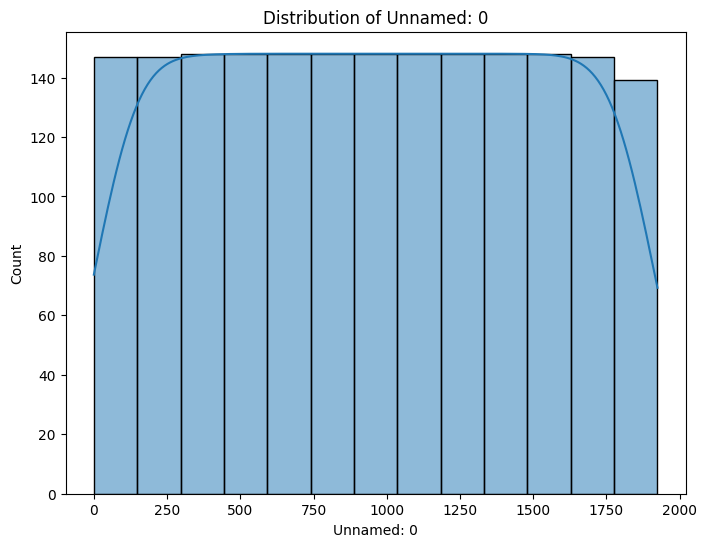

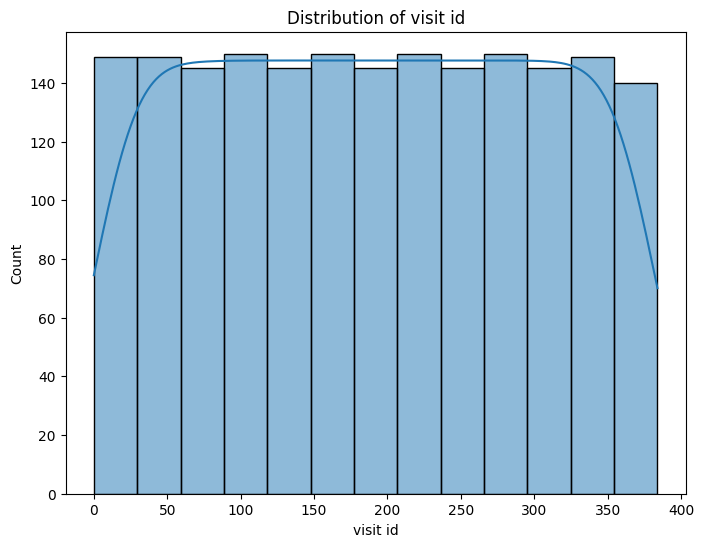

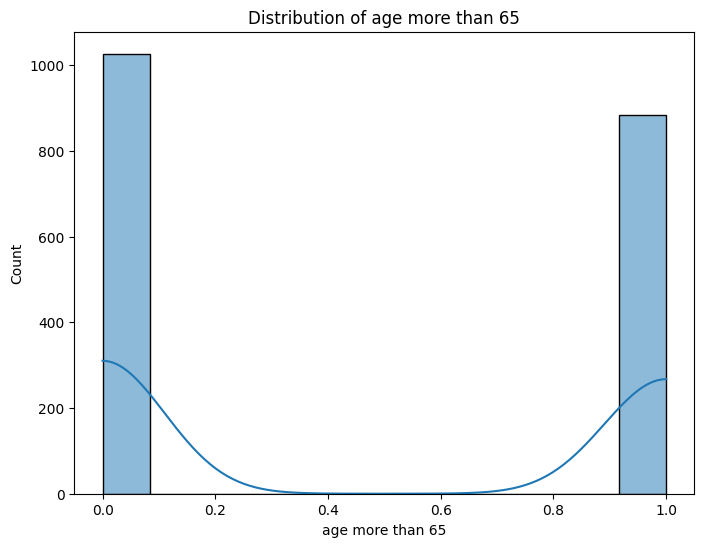

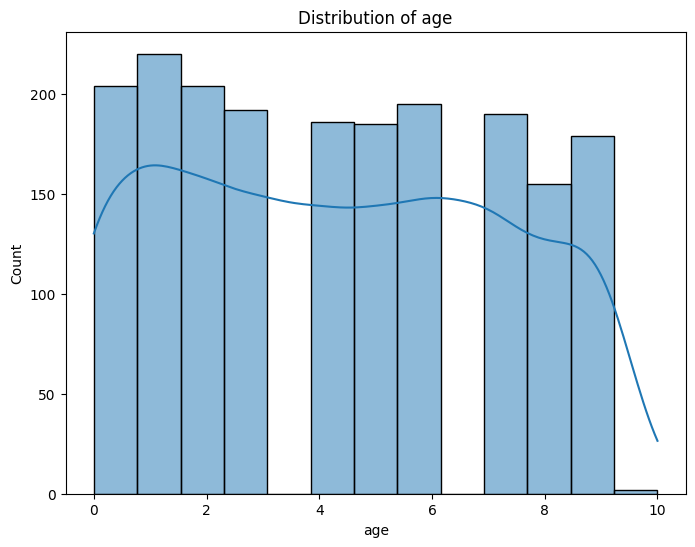

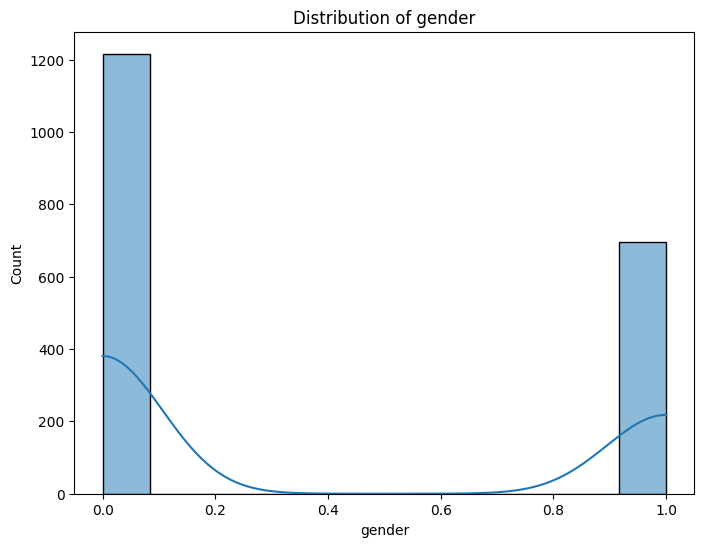

...

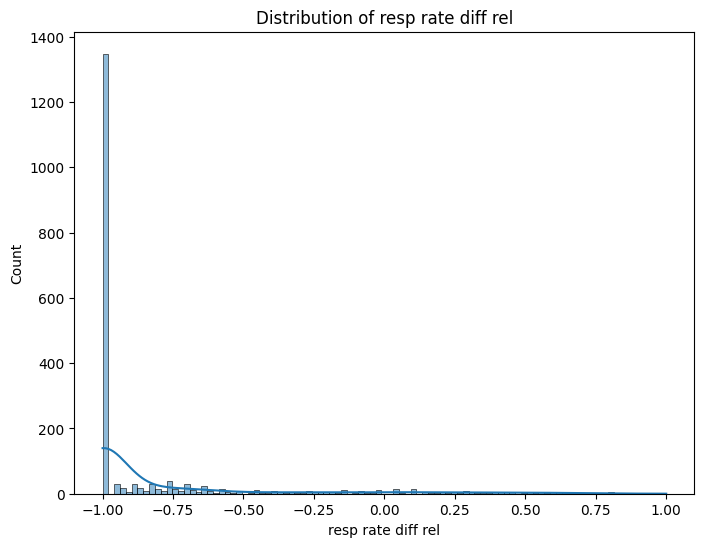

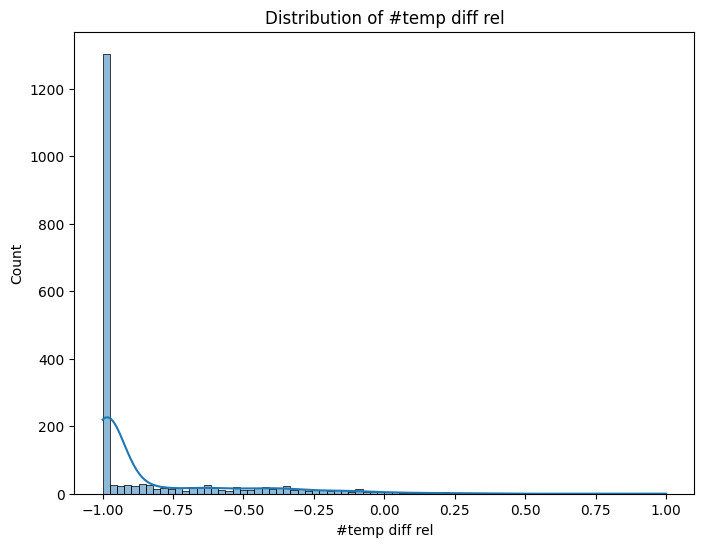

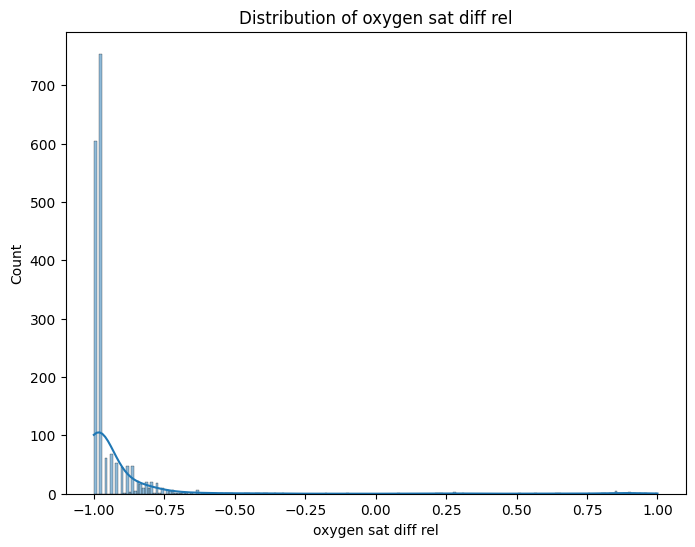

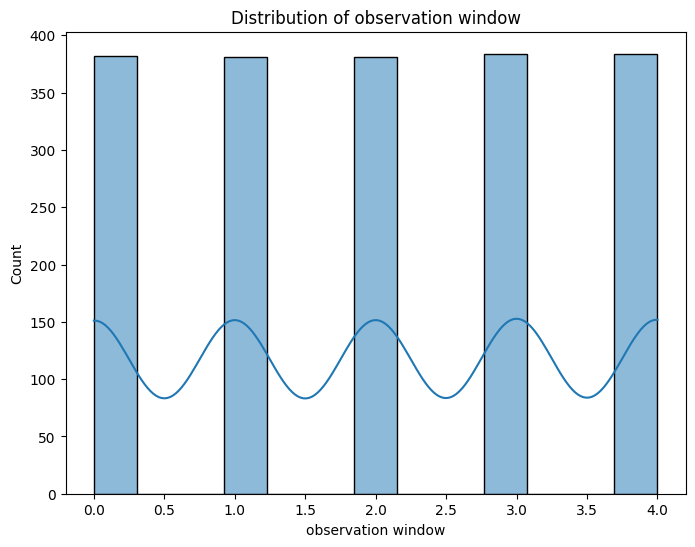

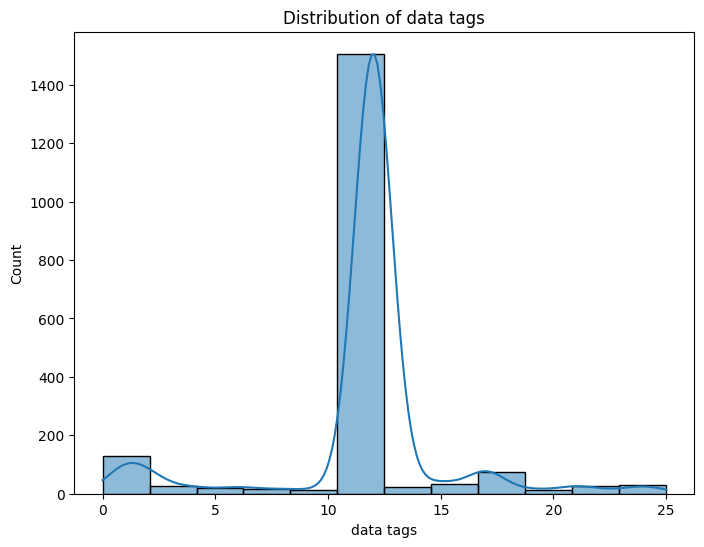

In [28]:
# prompt: check the distribution of all variables(features) using plots for visualization.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through all columns in the DataFrame
for column in data.columns:
  if column != 'target label / yes no':  # Exclude the target variable
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed

    # Check if the column is numerical
    if pd.api.types.is_numeric_dtype(data[column]):
      sns.histplot(data[column], kde=True)  # Histogram with KDE
      plt.title(f"Distribution of {column}")
    else:
      # For categorical variables, create a bar plot
      sns.countplot(x=column, data=data)
      plt.title(f"Distribution of {column}")

    plt.show()


In [29]:
# prompt: get the value of mean, median and mode for numerical columns.

import numpy as np
# Calculate mean, median, and mode for numerical columns
numerical_columns = data.select_dtypes(include=np.number).columns

for column in numerical_columns:
  if column != 'target label / yes no':  # Exclude the target variable
    mean_value = data[column].mean()
    median_value = data[column].median()
    mode_value = data[column].mode()[0] if not data[column].mode().empty else None

    print(f"Column: {column}")
    print(f"Mean: {mean_value}")
    print(f"Median: {median_value}")
    print(f"Mode: {mode_value}")
    print("-" * 20)


Column: Unnamed: 0
Mean: 957.5292887029289
Median: 957.5
Mode: 0
--------------------
Column: visit id
Mean: 191.10512552301256
Median: 191.0
Mode: 0
--------------------
Column: age more than 65
Mean: 0.4628661087866109
Median: 0.0
Mode: 0.0
--------------------
Column: age
Mean: 4.311715481171548
Median: 4.0
Mode: 1
--------------------
Column: gender
Mean: 0.36401673640167365
Median: 0.0
Mode: 0.0
--------------------
Column: hypertension
Mean: 0.21182008368200836
Median: 0.0
Mode: 0.0
--------------------
Column: immuno status
Mean: 0.15585774058577406
Median: 0.0
Mode: 0.0
--------------------
Column: other conditions
Mean: 0.8117154811715481
Median: 1.0
Mode: 1.0
--------------------
Column: albumin# median
Mean: 0.5295085139318882
Median: 0.5295085139318884
Mode: 0.5295085139318884
--------------------
Column: albumin mean
Mean: 0.5295085139318882
Median: 0.5295085139318884
Mode: 0.5295085139318884
--------------------
Column: albumin min
Mean: 0.5294155634484984
Median: 0.52941

Target variable class distribution:
target label / yes no
0    1400
1     512
Name: count, dtype: int64


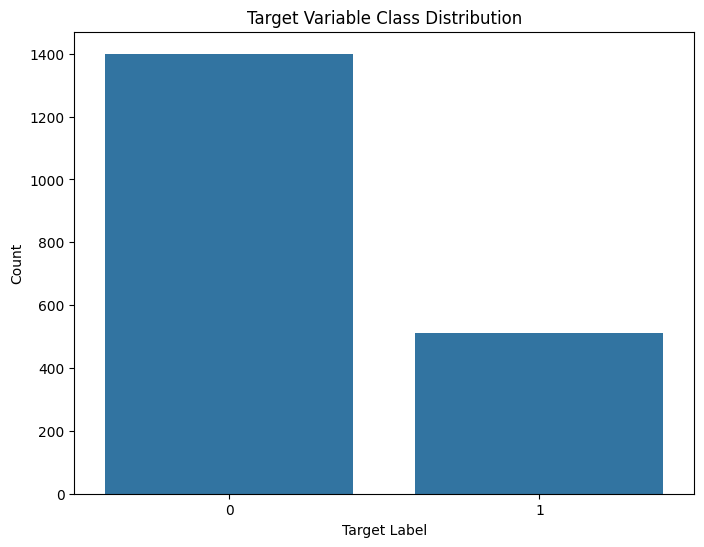

Streaming output truncated to the last 5000 lines.
 0.218935     0.052301
 1.000000     0.052301
-1.000000     0.052301
Name: count, Length: 74, dtype: float64

Feature: pO2 venous diff
pO2 venous diff
-1.0    1912
Name: count, dtype: int64

Feature pO2 venous diff class percentages:
pO2 venous diff
-1.0    100.0
Name: count, dtype: float64

Feature: pCO2 arterial median
pCO2 arterial median
-0.779310    1808
-0.793103      11
-0.820690       8
-0.751724       7
-0.765517       7
-0.737931       6
-0.806897       5
-0.917241       5
-0.834483       5
-0.889655       4
-0.848276       4
-0.613793       4
-0.710345       3
-0.682759       3
-0.875862       3
-0.931034       3
-0.862069       3
-0.696552       3
-0.972414       2
-0.627586       2
-0.958621       2
-0.724138       2
-0.668966       1
-0.634483       1
 1.000000       1
-0.641379       1
-0.489655       1
-0.855172       1
-0.558621       1
-1.000000       1
-0.903448       1
-0.600000       1
-0.655172       1
-0.310345  

In [30]:
# prompt: check whether the dataset is balanced or imbalanced among different features.

import pandas as pd
import matplotlib.pyplot as plt
# Check class distribution for the target variable
target_counts = data['target label / yes no'].value_counts()
print("Target variable class distribution:")
print(target_counts)

# Visualize the class distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='target label / yes no', data=data)
plt.title('Target Variable Class Distribution')
plt.xlabel('Target Label')
plt.ylabel('Count')
plt.show()

# Calculate the percentage of each class
target_percentages = target_counts / len(data) * 100
print("\nTarget variable class percentages:")
print(target_percentages)

# Check class distribution for other features
for column in data.columns:
  if column != 'target label / yes no':
    feature_counts = data[column].value_counts()
    print(f"\nFeature: {column}")
    print(feature_counts)

    # Visualize the class distribution for the feature (if it's categorical)
    if not pd.api.types.is_numeric_dtype(data[column]):
      plt.figure(figsize=(8, 6))
      sns.countplot(x=column, data=data)
      plt.title(f'Feature {column} Class Distribution')
      plt.xlabel(column)
      plt.ylabel('Count')
      plt.show()

    # Calculate the percentage of each class for the feature
    feature_percentages = feature_counts / len(data) * 100
    print(f"\nFeature {column} class percentages:")
    print(feature_percentages)


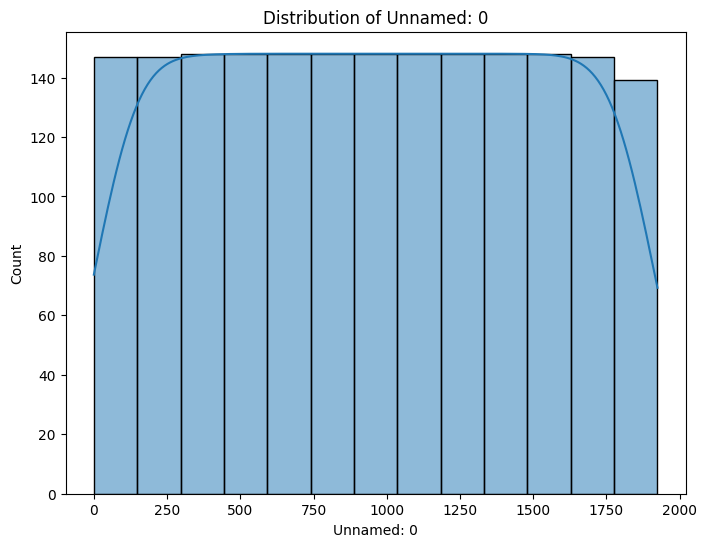

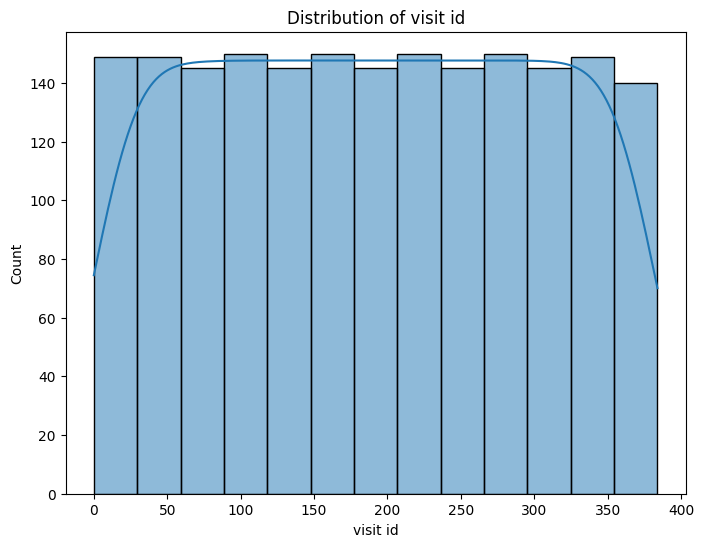

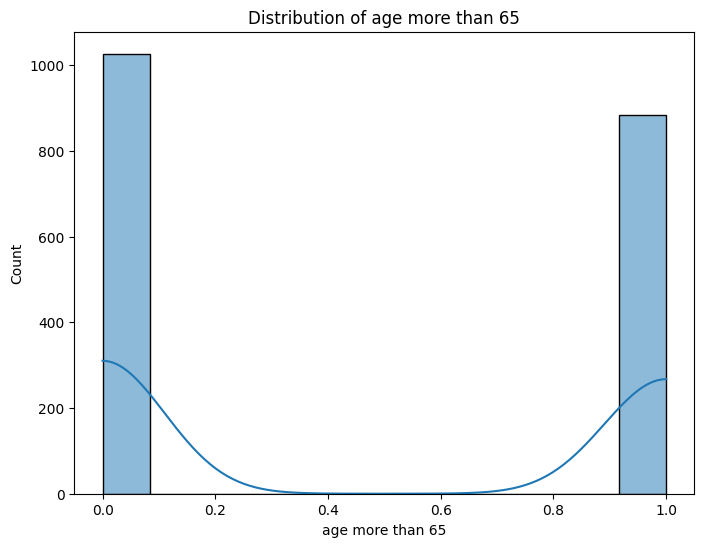

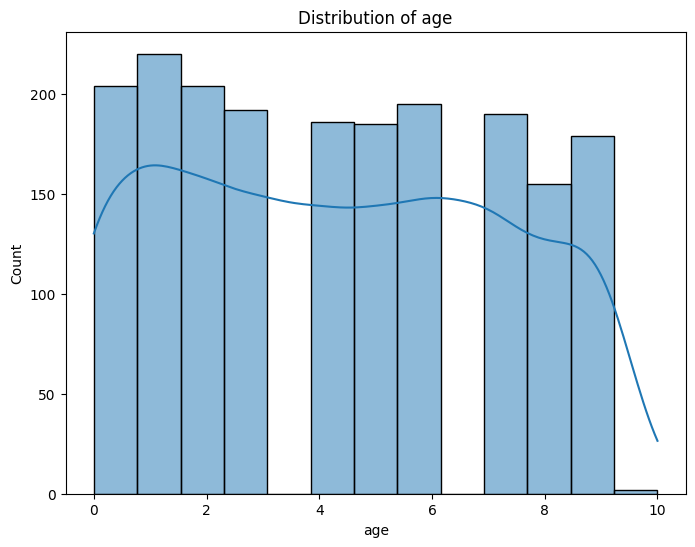

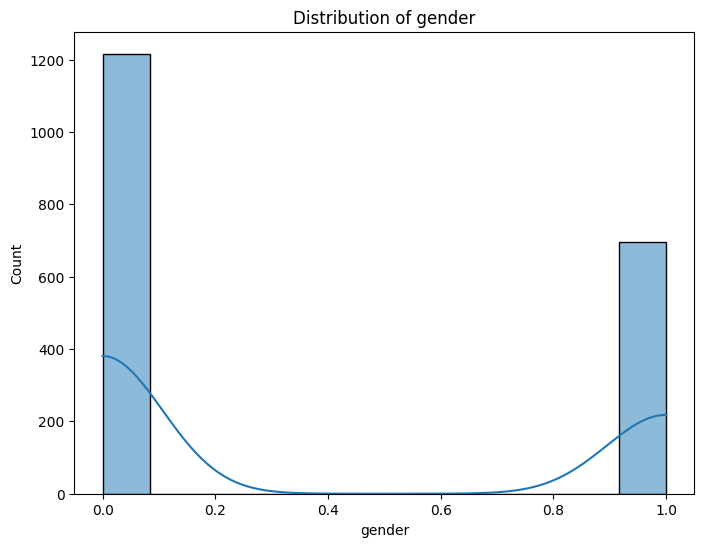

...

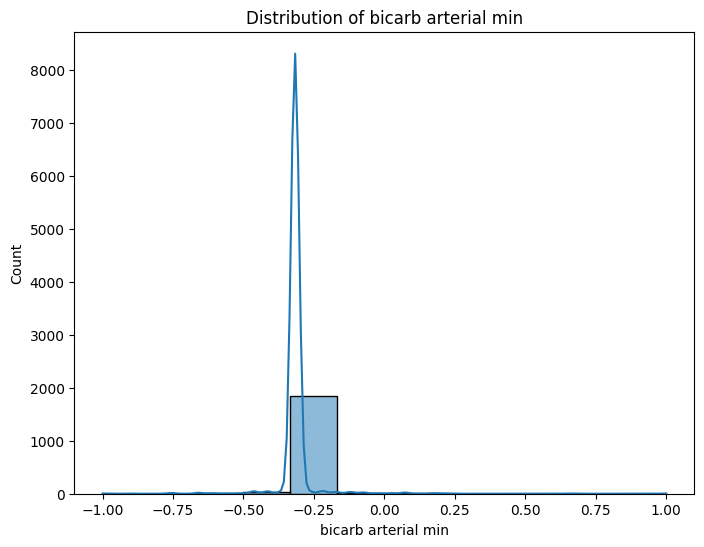

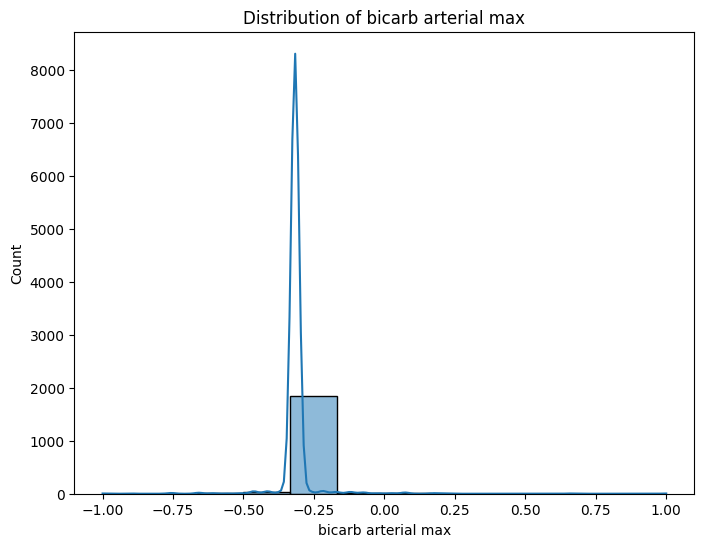

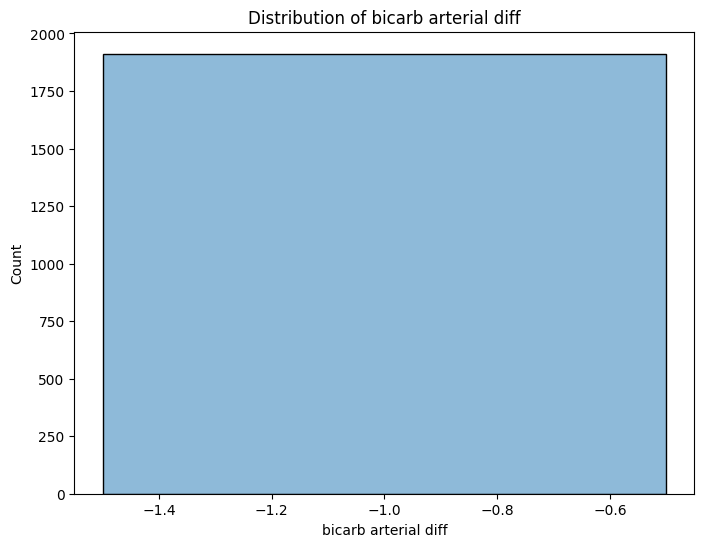

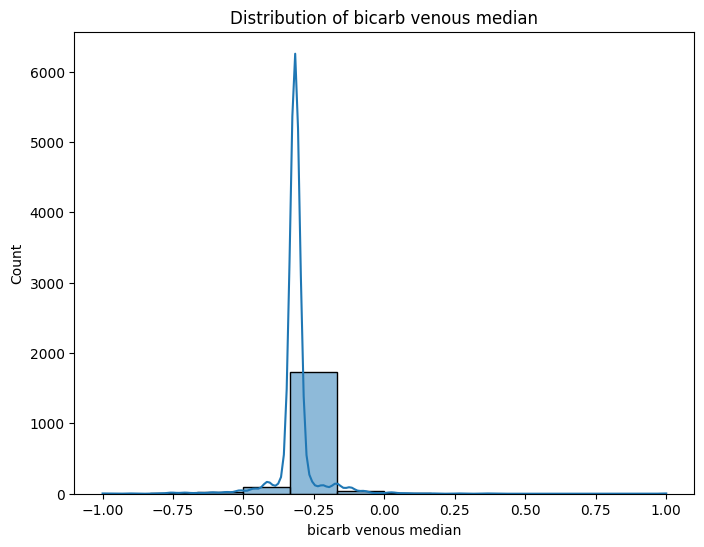

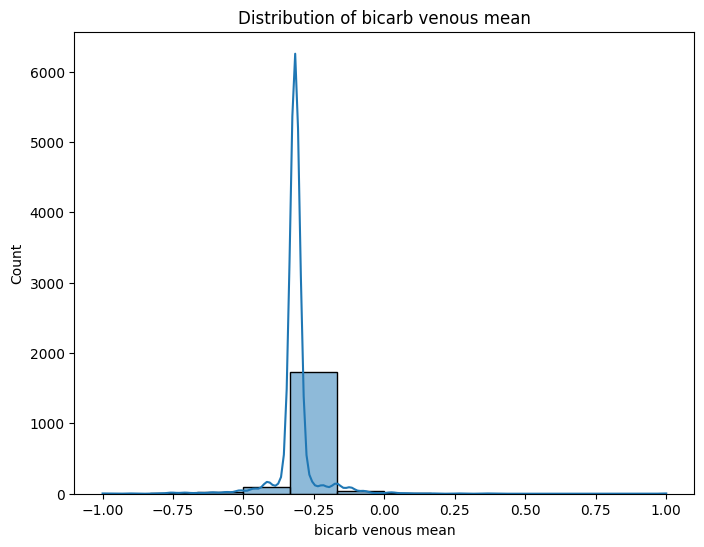

Exception ignored in: <function _xla_gc_callback at 0x7cff16f2a200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 98, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


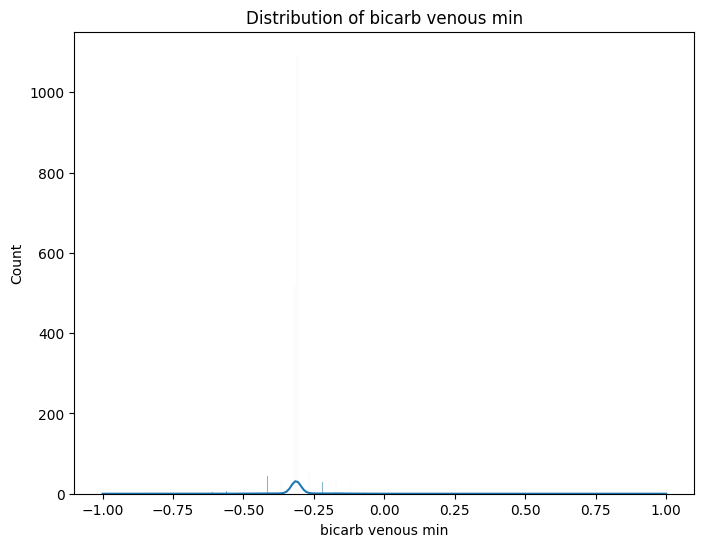

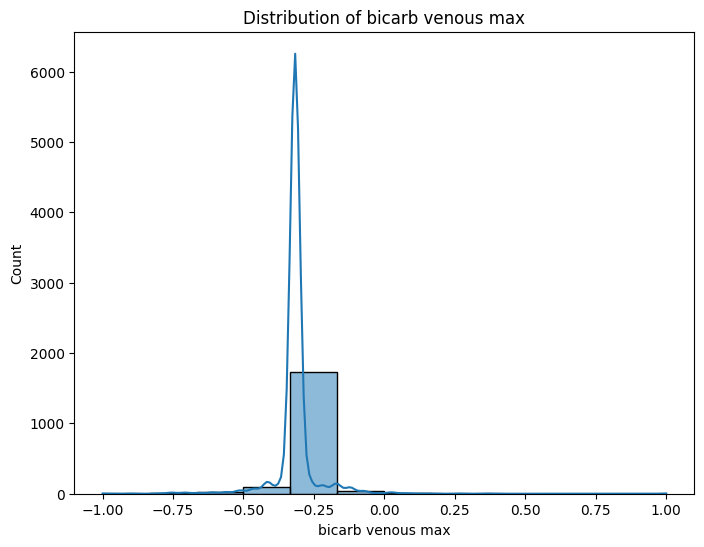

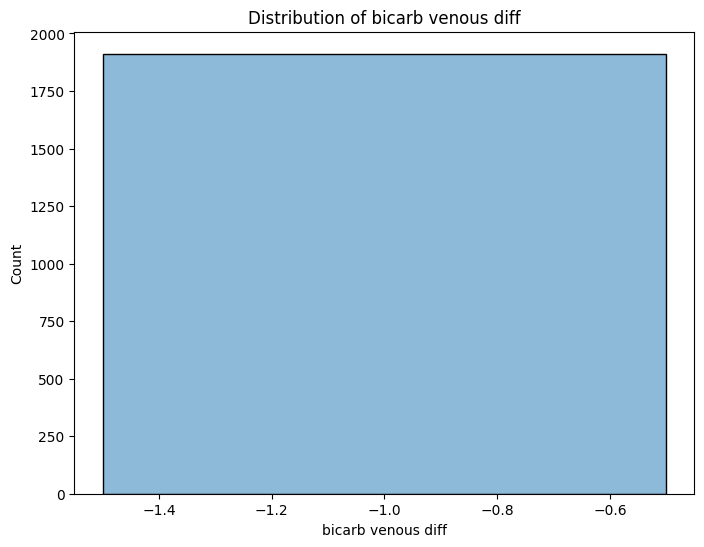

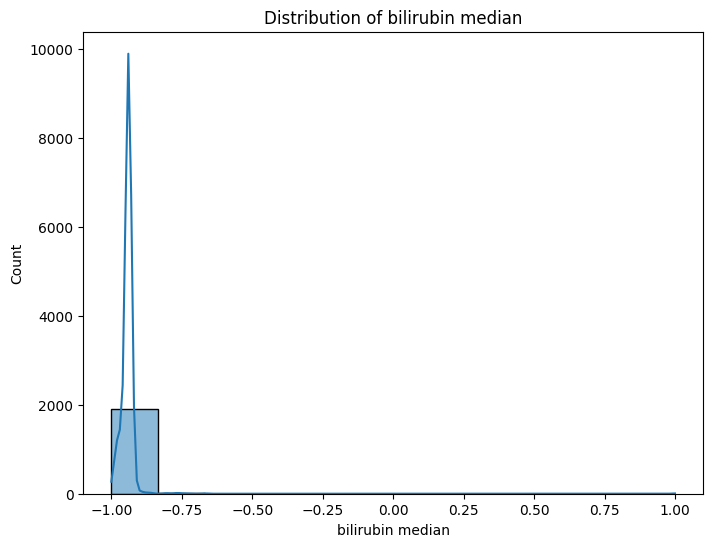

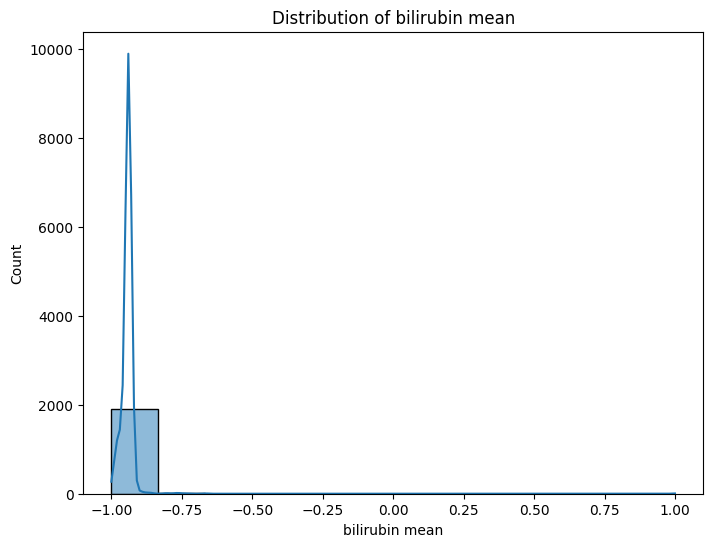

...

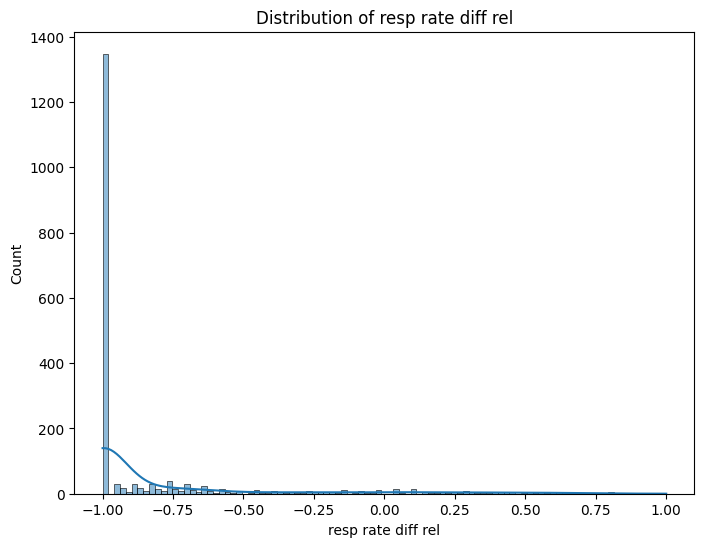

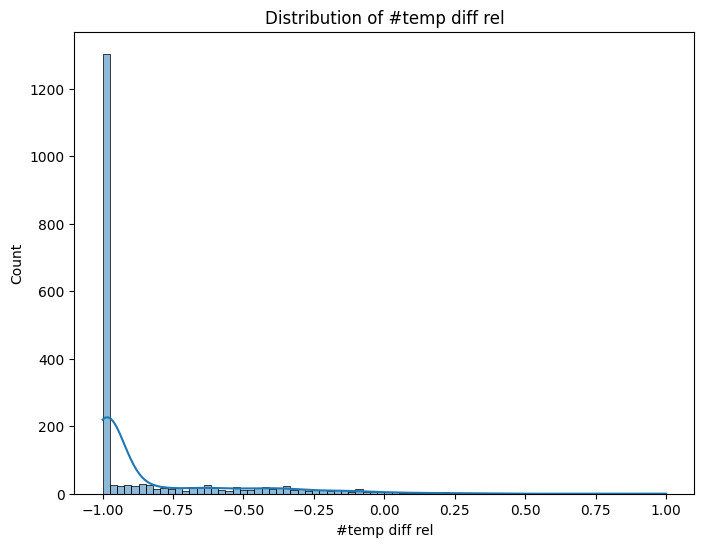

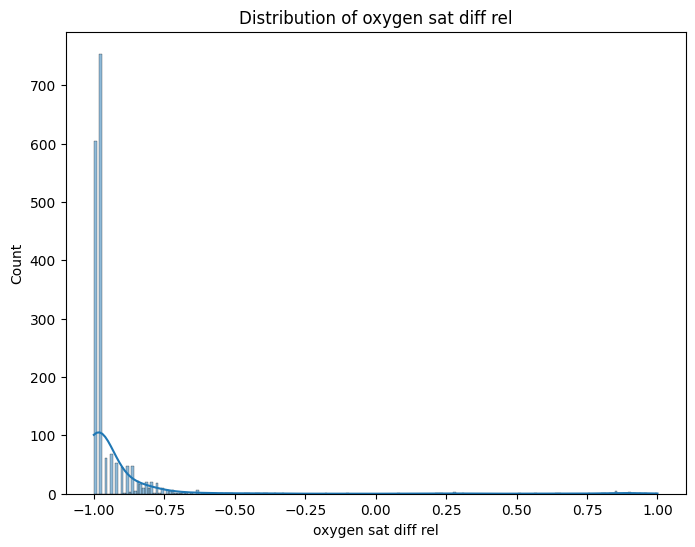

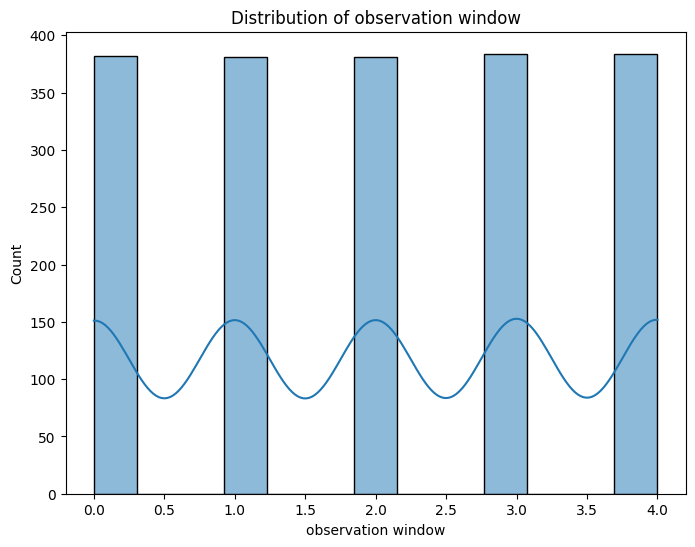

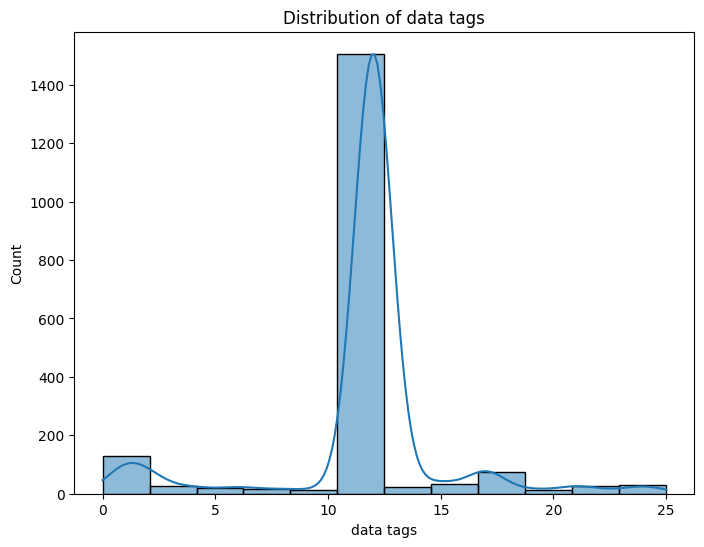

In [31]:
# prompt: show the result of last cell as plots of frequency of values present in each column against the values themeselves.

import pandas as pd
import matplotlib.pyplot as plt
# Loop through all columns in the DataFrame
for column in data.columns:
  if column != 'target label / yes no':  # Exclude the target variable
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed

    # Check if the column is numerical
    if pd.api.types.is_numeric_dtype(data[column]):
      sns.histplot(data[column], kde=True)  # Histogram with KDE
      plt.title(f"Distribution of {column}")
    else:
      # For categorical variables, create a bar plot
      sns.countplot(x=column, data=data)
      plt.title(f"Distribution of {column}")

    plt.show()


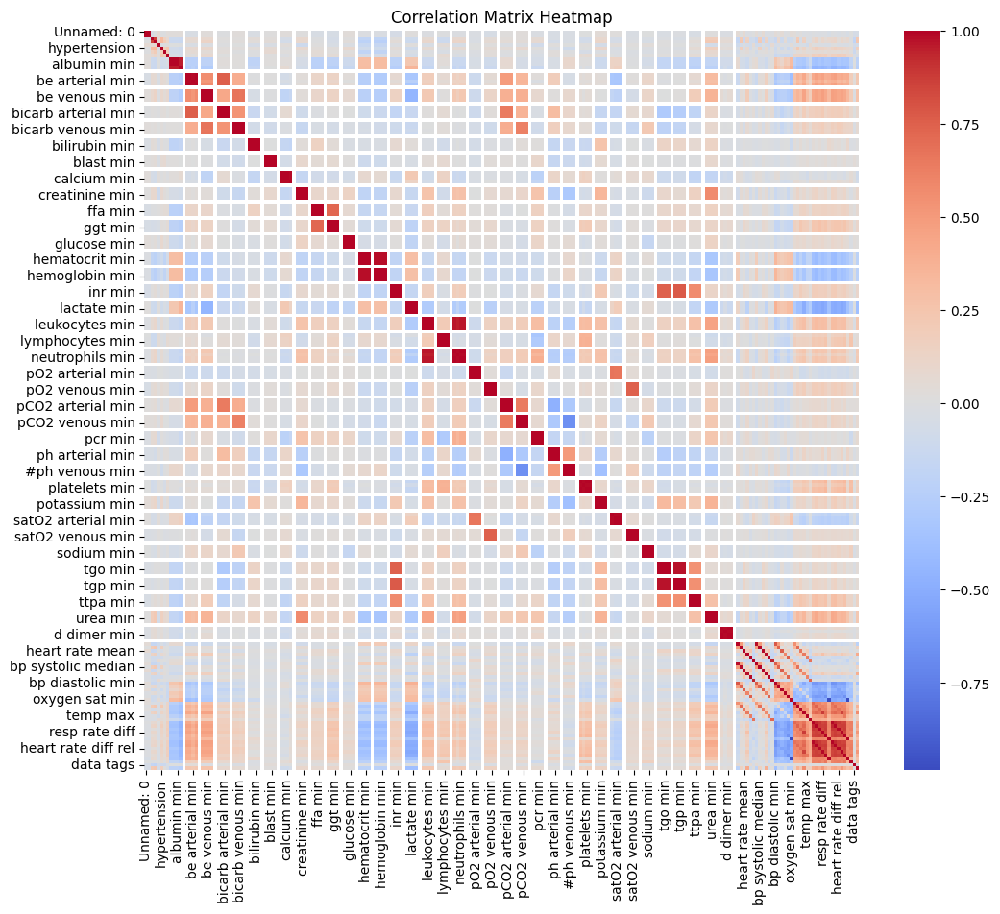

In [34]:
# prompt: I need you to find the relations between features using correlation matrix and showing correlation heatmap.

import matplotlib.pyplot as plt
import seaborn as sns
# Calculate the correlation matrix
correlation_matrix = data.corr()

# # Display the correlation matrix
# print("Correlation Matrix:")
# print(correlation_matrix)

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()


In [35]:
# prompt: delete the features(columns) which has very low correlation with target variable(last column) to make the dataset more abstract.

# Calculate the correlation between each feature and the target variable
correlation_with_target = data.corr()['target label / yes no'].abs()

# Set a threshold for correlation (e.g., 0.1)
correlation_threshold = 0.1

# Get a list of features with correlation below the threshold
features_to_remove = correlation_with_target[correlation_with_target < correlation_threshold].index.tolist()

# Remove the features from the dataset
data = data.drop(columns=features_to_remove)

# Print the updated dataset shape
print("Updated dataset shape:", data.shape)


Updated dataset shape: (1912, 134)


In [36]:
# prompt: split the data into test and train sets for further steps.

from sklearn.model_selection import train_test_split

# Separate features (X) and target (y)
X = data.drop('target label / yes no', axis=1)
y = data['target label / yes no']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (1529, 133)
X_test shape: (383, 133)
y_train shape: (1529,)
y_test shape: (383,)


In [39]:
# prompt: report the number of unique values present in target column now.

print("Number of unique values in the target column:", data['target label / yes no'].nunique())


Number of unique values in the target column: 2


In [40]:
# prompt: report what are those values.

print("Unique values in the target column:", data['target label / yes no'].unique())


Unique values in the target column: [0 1]


In [43]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.utils import resample

# Define a list of models to try
models = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    SVC(probability=True),  # Enable probability estimation for ROC AUC
    KNeighborsClassifier()
]

# Number of iterations for resampling and training
num_iterations = 5

for model in models:
  print(f"\nTraining {type(model).__name__}")

  for i in range(num_iterations):
    print(f"\nIteration {i+1}")

    # Separate classes in the training set
    class_0 = X_train[y_train == 0]
    class_1 = X_train[y_train == 1]

    # Determine the smaller class size
    n_samples = min(len(class_0), len(class_1))

    # Resample both classes to have equal number of samples
    class_0_resampled = resample(class_0, replace=False, n_samples=n_samples, random_state=i)
    class_1_resampled = resample(class_1, replace=False, n_samples=n_samples, random_state=i)

    # Combine the resampled classes
    X_train_resampled = pd.concat([class_0_resampled, class_1_resampled])
    y_train_resampled = pd.concat([pd.Series([0] * n_samples), pd.Series([1] * n_samples)])

    # Ensure y_train_resampled is of integer type
    y_train_resampled = y_train_resampled.astype(int)

    # Train the model on the resampled data
    model.fit(X_train_resampled, y_train_resampled)

    # Make predictions on the test set
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]  # Probability of class 1

    # Ensure both y_test and y_pred are of the same data type (int)
    y_pred = y_pred.astype(int)
    y_test = y_test.astype(int)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    # Print the evaluation metrics
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}")
    print(f"ROC AUC: {roc_auc:.4f}")


Training LogisticRegression

Iteration 1
Accuracy: 0.8512
Precision: 0.6810
Recall: 0.7980
F1-score: 0.7349
ROC AUC: 0.8932

Iteration 2


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Accuracy: 0.8381
Precision: 0.6609
Recall: 0.7677
F1-score: 0.7103
ROC AUC: 0.8859

Iteration 3
Accuracy: 0.8303
Precision: 0.6441
Recall: 0.7677
F1-score: 0.7005
ROC AUC: 0.8884

Iteration 4


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Accuracy: 0.8303
Precision: 0.6441
Recall: 0.7677
F1-score: 0.7005
ROC AUC: 0.8854

Iteration 5
Accuracy: 0.8381
Precision: 0.6529
Recall: 0.7980
F1-score: 0.7182
ROC AUC: 0.8904

Training DecisionTreeClassifier

Iteration 1
Accuracy: 0.7702
Precision: 0.5379
Recall: 0.7879
F1-score: 0.6393
ROC AUC: 0.7846

Iteration 2
Accuracy: 0.7676
Precision: 0.5347
Recall: 0.7778
F1-score: 0.6337
ROC AUC: 0.7742

Iteration 3
Accuracy: 0.7859
Precision: 0.5612
Recall: 0.7879
F1-score: 0.6555
ROC AUC: 0.7922

Iteration 4
Accuracy: 0.7676
Precision: 0.5379
Recall: 0.7172
F1-score: 0.6147
ROC AUC: 0.7562

Iteration 5
Accuracy: 0.7598
Precision: 0.5255
Recall: 0.7273
F1-score: 0.6102
ROC AUC: 0.7565

Training RandomForestClassifier

Iteration 1
Accuracy: 0.8068
Precision: 0.5926
Recall: 0.8081
F1-score: 0.6838
ROC AUC: 0.9010

Iteration 2
Accuracy: 0.8120
Precision: 0.5971
Recall: 0.8384
F1-score: 0.6975
ROC AUC: 0.9085

Iteration 3
Accuracy: 0.7963
Precision: 0.5766
Recall: 0.7980
F1-score: 0.6695
ROC

In [44]:
# prompt: show which one of the above models has had the best performance

import pandas as pd
# Create a dictionary to store the best performance for each model
best_model_performance = {}

# Iterate through the models
for model in models:
  model_name = type(model).__name__
  best_model_performance[model_name] = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc': 0}

# Iterate through the models and their results to find the best performance
for model in models:
    model_name = type(model).__name__
    for i in range(num_iterations):
        # Separate classes in the training set
        class_0 = X_train[y_train == 0]
        class_1 = X_train[y_train == 1]

        # Determine the smaller class size
        n_samples = min(len(class_0), len(class_1))

        # Resample both classes to have equal number of samples
        class_0_resampled = resample(class_0, replace=False, n_samples=n_samples, random_state=i)
        class_1_resampled = resample(class_1, replace=False, n_samples=n_samples, random_state=i)

        # Combine the resampled classes
        X_train_resampled = pd.concat([class_0_resampled, class_1_resampled])
        y_train_resampled = pd.concat([pd.Series([0] * n_samples), pd.Series([1] * n_samples)])

        # Ensure y_train_resampled is of integer type
        y_train_resampled = y_train_resampled.astype(int)

        # Train the model on the resampled data
        model.fit(X_train_resampled, y_train_resampled)

        # Make predictions on the test set
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]  # Probability of class 1

        # Calculate evaluation metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_prob)

        # Update best performance for the current model
        if accuracy > best_model_performance[model_name]['accuracy']:
            best_model_performance[model_name]['accuracy'] = accuracy
        if precision > best_model_performance[model_name]['precision']:
            best_model_performance[model_name]['precision'] = precision
        if recall > best_model_performance[model_name]['recall']:
            best_model_performance[model_name]['recall'] = recall
        if f1 > best_model_performance[model_name]['f1']:
            best_model_performance[model_name]['f1'] = f1
        if roc_auc > best_model_performance[model_name]['roc_auc']:
            best_model_performance[model_name]['roc_auc'] = roc_auc

# Find the model with the highest accuracy (or another metric if preferred)
best_model = max(best_model_performance, key=lambda k: best_model_performance[k]['accuracy'])

# Print the best model
print(f"\nThe model with the best performance is: {best_model}")
print(f"Best Accuracy: {best_model_performance[best_model]['accuracy']:.4f}")
print(f"Best Precision: {best_model_performance[best_model]['precision']:.4f}")
print(f"Best Recall: {best_model_performance[best_model]['recall']:.4f}")
print(f"Best F1-score: {best_model_performance[best_model]['f1']:.4f}")
print(f"Best ROC AUC: {best_model_performance[best_model]['roc_auc']:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c


The model with the best performance is: LogisticRegression
Best Accuracy: 0.8512
Best Precision: 0.6810
Best Recall: 0.7980
Best F1-score: 0.7349
Best ROC AUC: 0.8932


In [45]:
# prompt: now, using more iterations, and with the technique which i explained above for oversampling from the class which is of less count, train the best model you just said over training set. during the training, tune the hyperparameters using techniques such as grid search, random search. also use cross validation for evaluating the stability of model and preventing it from overfitting.

import pandas as pd
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import make_scorer, f1_score

# Assuming 'best_model' and 'best_model_performance' are defined from the previous code

# Increase the number of iterations for resampling
num_iterations = 10  # You can adjust this

# Create a dictionary to store the best performance for the best model with tuned hyperparameters
best_tuned_model_performance = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc': 0}

# Define the hyperparameter grid or distribution to search over
if best_model == 'RandomForestClassifier':
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
    # Create a Random Forest classifier
    model = RandomForestClassifier(random_state=42)

elif best_model == 'SVC':
    param_grid = {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf', 'poly'],
        'gamma': ['scale', 'auto']
    }
    # Create a Support Vector Classifier
    model = SVC(probability=True, random_state=42)

elif best_model == 'LogisticRegression':
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear']  # Use 'liblinear' for L1 penalty
    }
    # Create a Logistic Regression classifier
    model = LogisticRegression(random_state=42)

elif best_model == 'DecisionTreeClassifier':
    param_grid = {
        'max_depth': [None, 5, 10, 15],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'criterion': ['gini', 'entropy']
    }
    # Create a Decision Tree Classifier
    model = DecisionTreeClassifier(random_state=42)

elif best_model == 'KNeighborsClassifier':
    param_grid = {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }
    # Create a K-Nearest Neighbors Classifier
    model = KNeighborsClassifier()


# Create a StratifiedKFold cross-validator
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the scoring metric for the grid search
scoring = {'f1': make_scorer(f1_score), 'accuracy': 'accuracy', 'precision': 'precision', 'recall': 'recall', 'roc_auc': 'roc_auc'}


# Create a GridSearchCV or RandomizedSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, refit='f1', cv=cv, n_jobs=-1, verbose=2)

# Use RandomizedSearchCV if the hyperparameter space is large
# grid_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, scoring=scoring, refit='f1', cv=cv, n_jobs=-1, verbose=2, n_iter=20)


for i in range(num_iterations):
    print(f"\nIteration {i+1}")

    # Separate classes in the training set
    class_0 = X_train[y_train == 0]
    class_1 = X_train[y_train == 1]

    # Determine the smaller class size
    n_samples = min(len(class_0), len(class_1))

    # Resample both classes to have equal number of samples
    class_0_resampled = resample(class_0, replace=False, n_samples=n_samples, random_state=i)
    class_1_resampled = resample(class_1, replace=False, n_samples=n_samples, random_state=i)

    # Combine the resampled classes
    X_train_resampled = pd.concat([class_0_resampled, class_1_resampled])
    y_train_resampled = pd.concat([pd.Series([0] * n_samples), pd.Series([1] * n_samples)])

    # Ensure y_train_resampled is of integer type
    y_train_resampled = y_train_resampled.astype(int)

    # Fit the grid search to the resampled data
    grid_search.fit(X_train_resampled, y_train_resampled)

    # Get the best estimator from the grid search
    best_estimator = grid_search.best_estimator_

    # Make predictions on the test set using the best estimator
    y_pred = best_estimator.predict(X_test)
    y_prob = best_estimator.predict_proba(X_test)[:, 1]  # Probability of class 1

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    # Update best performance for the current model with tuned hyperparameters
    if accuracy > best_tuned_model_performance['accuracy']:
        best_tuned_model_performance['accuracy'] = accuracy
    if precision > best_tuned_model_performance['precision']:
        best_tuned_model_performance['precision'] = precision
    if recall > best_tuned_model_performance['recall']:
        best_tuned_model_performance['recall'] = recall
    if f1 > best_tuned_model_performance['f1']:
        best_tuned_model_performance['f1'] = f1
    if roc_auc > best_tuned_model_performance['roc_auc']:
        best_tuned_model_performance['roc_auc'] = roc_auc

# Print the best model with tuned hyperparameters and its performance
print(f"\nThe best tuned {best_model} model:")
print(f"Best Accuracy: {best_tuned_model_performance['accuracy']:.4f}")
print(f"Best Precision: {best_tuned_model_performance['precision']:.4f}")
print(f"Best Recall: {best_tuned_model_performance['recall']:.4f}")
print(f"Best F1-score: {best_tuned_model_performance['f1']:.4f}")
print(f"Best ROC AUC: {best_tuned_model_performance['roc_auc']:.4f}")

# Print the best hyperparameters
print("\nBest Hyperparameters:", grid_search.best_params_)



Iteration 1
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()



Iteration 2
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 3
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 4
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 5
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 6
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 7
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 8
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 9
Fitting 5 folds for each of 12 candidates, totalling 60 fits

Iteration 10
Fitting 5 folds for each of 12 candidates, totalling 60 fits

The best tuned LogisticRegression model:
Best Accuracy: 0.8538
Best Precision: 0.6838
Best Recall: 0.8081
Best F1-score: 0.7407
Best ROC AUC: 0.9051

Best Hyperparameters: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
